<h4>Image classification using Keras Tensorflow framework<h4/>

<h4>Import all the needed libraries</h4>

In [121]:
# For Model
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import keras_tuner as kt
import sklearn

# For Plotting
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# For Array Manipulation
import numpy as np

# For Image Manipulation
import cv2

# For i/o related functions
import os

# for system memory issue: https://stackoverflow.com/questions/50304156/tensorflow-allocation-memory-allocation-of-38535168-exceeds-10-of-system-memor
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'


<h4>Declare all the needed global variables and paths</h4>

In [122]:
# Folder paths
path_cabbage_train = "dataset/train/cabbage"
path_apple_train = "dataset/train/apple"
path_cabbage_test = "dataset/test/cabbage"
path_apple_test = "dataset/test/apple"


images_cabbage_train = onlyfiles = [
    os.path.join(path_cabbage_train, f)
    for f in os.listdir(path_cabbage_train)
    if os.path.isfile(os.path.join(path_cabbage_train, f))
]
images_apple_train = [
    os.path.join(path_apple_train, f)
    for f in os.listdir(path_apple_train)
    if os.path.isfile(os.path.join(path_apple_train, f))
]
images_cabbage_test = [
    os.path.join(path_cabbage_test, f)
    for f in os.listdir(path_cabbage_test)
    if os.path.isfile(os.path.join(path_cabbage_test, f))
]
images_apple_test = [
    os.path.join(path_apple_test, f)
    for f in os.listdir(path_apple_test)
    if os.path.isfile(os.path.join(path_apple_test, f))
]


<h4>Make observations about the data</h4>

In [123]:
! ls dataset/train/

apple  cabbage


In [124]:
# Training data for cabbage
! ls $path_cabbage_train

r0_0.jpg    r0_124.jpg	r0_14.jpg   r0_174.jpg	r0_28.jpg  r0_52.jpg  r0_78.jpg
r0_100.jpg  r0_126.jpg	r0_150.jpg  r0_176.jpg	r0_2.jpg   r0_54.jpg  r0_80.jpg
r0_102.jpg  r0_128.jpg	r0_152.jpg  r0_178.jpg	r0_30.jpg  r0_56.jpg  r0_82.jpg
r0_104.jpg  r0_12.jpg	r0_154.jpg  r0_180.jpg	r0_32.jpg  r0_58.jpg  r0_84.jpg
r0_106.jpg  r0_130.jpg	r0_156.jpg  r0_182.jpg	r0_34.jpg  r0_60.jpg  r0_86.jpg
r0_108.jpg  r0_132.jpg	r0_158.jpg  r0_184.jpg	r0_36.jpg  r0_62.jpg  r0_88.jpg
r0_10.jpg   r0_134.jpg	r0_160.jpg  r0_186.jpg	r0_38.jpg  r0_64.jpg  r0_8.jpg
r0_110.jpg  r0_136.jpg	r0_162.jpg  r0_188.jpg	r0_40.jpg  r0_66.jpg  r0_90.jpg
r0_112.jpg  r0_138.jpg	r0_164.jpg  r0_18.jpg	r0_42.jpg  r0_68.jpg  r0_92.jpg
r0_114.jpg  r0_140.jpg	r0_166.jpg  r0_190.jpg	r0_44.jpg  r0_6.jpg   r0_94.jpg
r0_116.jpg  r0_142.jpg	r0_168.jpg  r0_20.jpg	r0_46.jpg  r0_70.jpg  r0_96.jpg
r0_118.jpg  r0_144.jpg	r0_16.jpg   r0_22.jpg	r0_48.jpg  r0_72.jpg  r0_98.jpg
r0_120.jpg  r0_146.jpg	r0_170.jpg  r0_24.jpg	r0_4.jpg   r0_74.jpg
r0_

In [125]:
# Training data for apple
! ls $path_apple_train

r0_0.jpg    r0_192.jpg	r0_288.jpg  r1_102.jpg	r1_196.jpg  r1_290.jpg
r0_100.jpg  r0_194.jpg	r0_28.jpg   r1_104.jpg	r1_198.jpg  r1_292.jpg
r0_102.jpg  r0_196.jpg	r0_290.jpg  r1_106.jpg	r1_200.jpg  r1_294.jpg
r0_104.jpg  r0_198.jpg	r0_292.jpg  r1_108.jpg	r1_202.jpg  r1_296.jpg
r0_106.jpg  r0_200.jpg	r0_294.jpg  r1_10.jpg	r1_204.jpg  r1_298.jpg
r0_108.jpg  r0_202.jpg	r0_296.jpg  r1_110.jpg	r1_206.jpg  r1_2.jpg
r0_10.jpg   r0_204.jpg	r0_298.jpg  r1_112.jpg	r1_208.jpg  r1_300.jpg
r0_110.jpg  r0_206.jpg	r0_2.jpg    r1_114.jpg	r1_20.jpg   r1_302.jpg
r0_112.jpg  r0_208.jpg	r0_300.jpg  r1_116.jpg	r1_210.jpg  r1_304.jpg
r0_114.jpg  r0_20.jpg	r0_302.jpg  r1_118.jpg	r1_212.jpg  r1_306.jpg
r0_116.jpg  r0_210.jpg	r0_304.jpg  r1_120.jpg	r1_214.jpg  r1_308.jpg
r0_118.jpg  r0_212.jpg	r0_306.jpg  r1_122.jpg	r1_216.jpg  r1_30.jpg
r0_120.jpg  r0_214.jpg	r0_30.jpg   r1_124.jpg	r1_218.jpg  r1_32.jpg
r0_122.jpg  r0_216.jpg	r0_32.jpg   r1_126.jpg	r1_220.jpg  r1_34.jpg
r0_124.jpg  r0_218.jpg	r0_34.jpg   r1_128

In [126]:
# Testing data for cabbage
! ls $path_cabbage_test

r0_103.jpg  r0_127.jpg	r0_155.jpg  r0_179.jpg	r0_35.jpg  r0_59.jpg  r0_83.jpg
r0_107.jpg  r0_131.jpg	r0_159.jpg  r0_183.jpg	r0_39.jpg  r0_63.jpg  r0_87.jpg
r0_111.jpg  r0_135.jpg	r0_15.jpg   r0_187.jpg	r0_3.jpg   r0_67.jpg  r0_91.jpg
r0_115.jpg  r0_139.jpg	r0_163.jpg  r0_19.jpg	r0_43.jpg  r0_71.jpg  r0_95.jpg
r0_119.jpg  r0_143.jpg	r0_167.jpg  r0_23.jpg	r0_47.jpg  r0_75.jpg  r0_99.jpg
r0_11.jpg   r0_147.jpg	r0_171.jpg  r0_27.jpg	r0_51.jpg  r0_79.jpg
r0_123.jpg  r0_151.jpg	r0_175.jpg  r0_31.jpg	r0_55.jpg  r0_7.jpg


In [127]:
# Testing data for apple
! ls $path_cabbage_test

r0_103.jpg  r0_127.jpg	r0_155.jpg  r0_179.jpg	r0_35.jpg  r0_59.jpg  r0_83.jpg
r0_107.jpg  r0_131.jpg	r0_159.jpg  r0_183.jpg	r0_39.jpg  r0_63.jpg  r0_87.jpg
r0_111.jpg  r0_135.jpg	r0_15.jpg   r0_187.jpg	r0_3.jpg   r0_67.jpg  r0_91.jpg
r0_115.jpg  r0_139.jpg	r0_163.jpg  r0_19.jpg	r0_43.jpg  r0_71.jpg  r0_95.jpg
r0_119.jpg  r0_143.jpg	r0_167.jpg  r0_23.jpg	r0_47.jpg  r0_75.jpg  r0_99.jpg
r0_11.jpg   r0_147.jpg	r0_171.jpg  r0_27.jpg	r0_51.jpg  r0_79.jpg
r0_123.jpg  r0_151.jpg	r0_175.jpg  r0_31.jpg	r0_55.jpg  r0_7.jpg


<h4>Get image properties</h4>

In [128]:
def get_image_properties(image):
    im = cv2.imread(image)
    h, w, c = im.shape
    print("Image:  ", image)
    print("width:  ", w)
    print("height: ", h)
    print("channel: ", c, "\n")

get_image_properties(images_cabbage_train[0])
get_image_properties(images_cabbage_train[1])
get_image_properties(images_cabbage_train[2])
get_image_properties(images_cabbage_train[3])

Image:   dataset/train/cabbage/r0_0.jpg
width:   1024
height:  1024
channel:  3 

Image:   dataset/train/cabbage/r0_10.jpg
width:   1024
height:  1024
channel:  3 

Image:   dataset/train/cabbage/r0_100.jpg
width:   1024
height:  1024
channel:  3 

Image:   dataset/train/cabbage/r0_102.jpg
width:   1024
height:  1024
channel:  3 



Conclusion of image property:<br/>
Not all images are sized equally.
However, all of the images are squarish-shaped.
For this reason, We can add padding to the images to make them perfectly square.
Once this is done, we can resize the images to make them smaller.

In [129]:
# Takes the list of image paths as a list which need to be modified and save the updated (padded) image to the same path
# Ref: https://stackoverflow.com/a/59698237/6559381
def new_image_height(image_list, new_image_width, new_image_height):
    for i in range(len(image_list)):
        # read image
        img = cv2.imread(image_list[i])
        old_image_height, old_image_width, channels = img.shape

        # create new image of desired size and color (blue) for padding
        color = (255, 255, 255)
        result = np.full(
            (new_image_height, new_image_width, channels), color, dtype=np.uint8
        )

        # compute center offset
        x_center = (new_image_width - old_image_width) // 2
        y_center = (new_image_height - old_image_height) // 2

        # copy img image into center of result image
        result[
            y_center : y_center + old_image_height,
            x_center : x_center + old_image_width,
        ] = img

        # view result
        # cv2.imshow("result", result)
        # cv2.waitKey(0)
        # cv2.destroyAllWindows()

        # Save the result
        cv2.imwrite(image_list[i], result)


new_image_height(images_apple_test, 1024, 1024)
new_image_height(images_apple_train, 1024, 1024)
new_image_height(images_cabbage_test, 1024, 1024)
new_image_height(images_cabbage_train, 1024, 1024)

get_image_properties(images_cabbage_train[0])
get_image_properties(images_apple_train[1])
get_image_properties(images_cabbage_test[2])
get_image_properties(images_apple_test[3])


Image:   dataset/train/cabbage/r0_0.jpg
width:   1024
height:  1024
channel:  3 

Image:   dataset/train/apple/r0_10.jpg
width:   1024
height:  1024
channel:  3 

Image:   dataset/test/cabbage/r0_11.jpg
width:   1024
height:  1024
channel:  3 

Image:   dataset/test/apple/r0_111.jpg
width:   1024
height:  1024
channel:  3 



<h4>Plot all the images to search for any errors</h4>

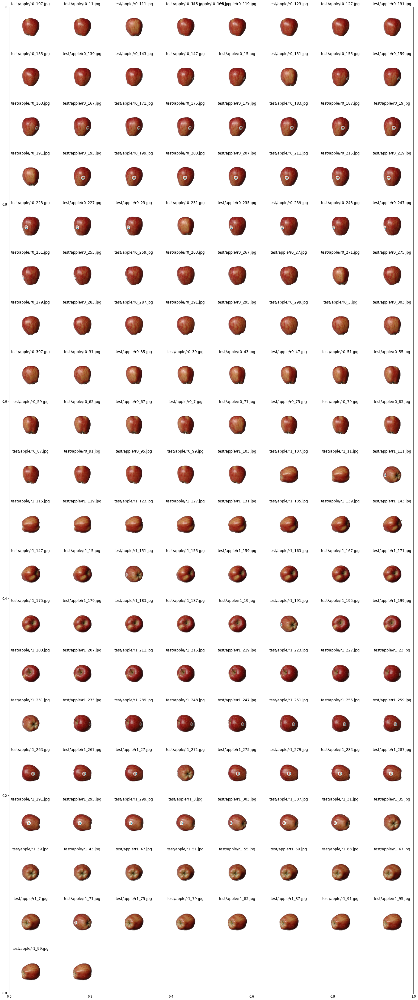

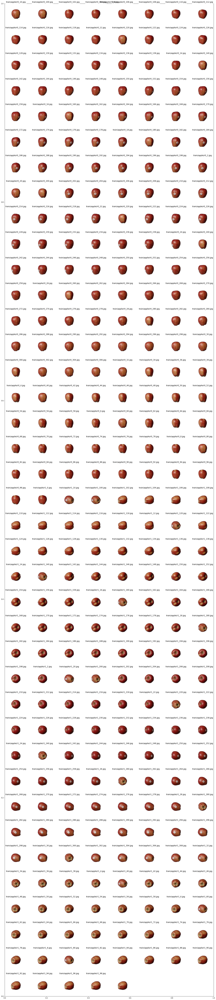

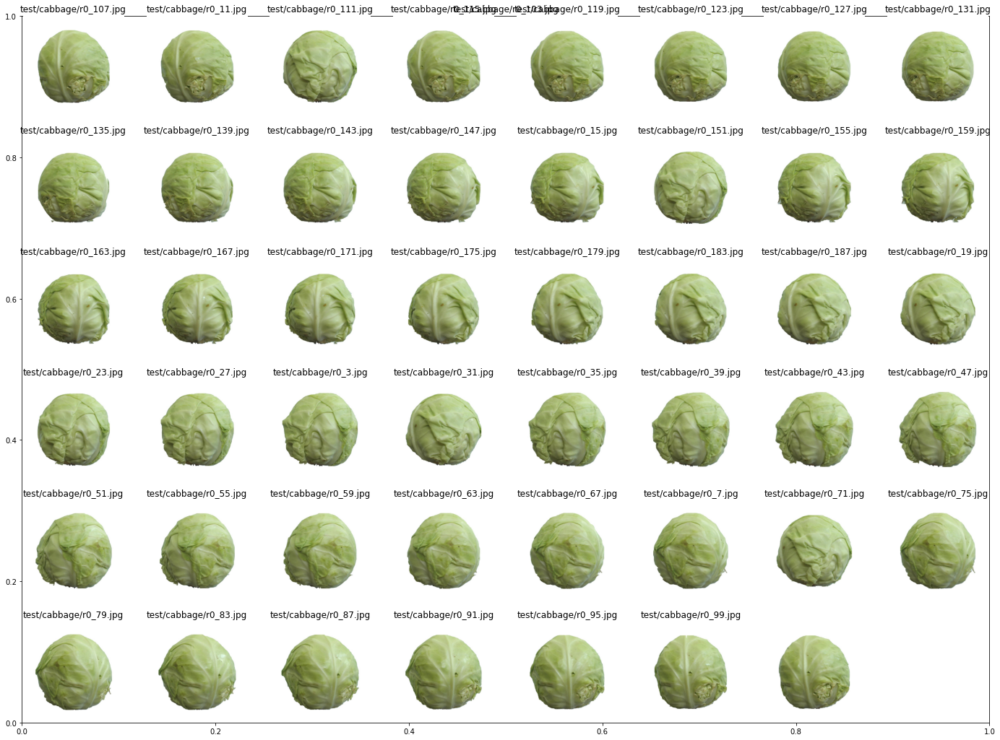

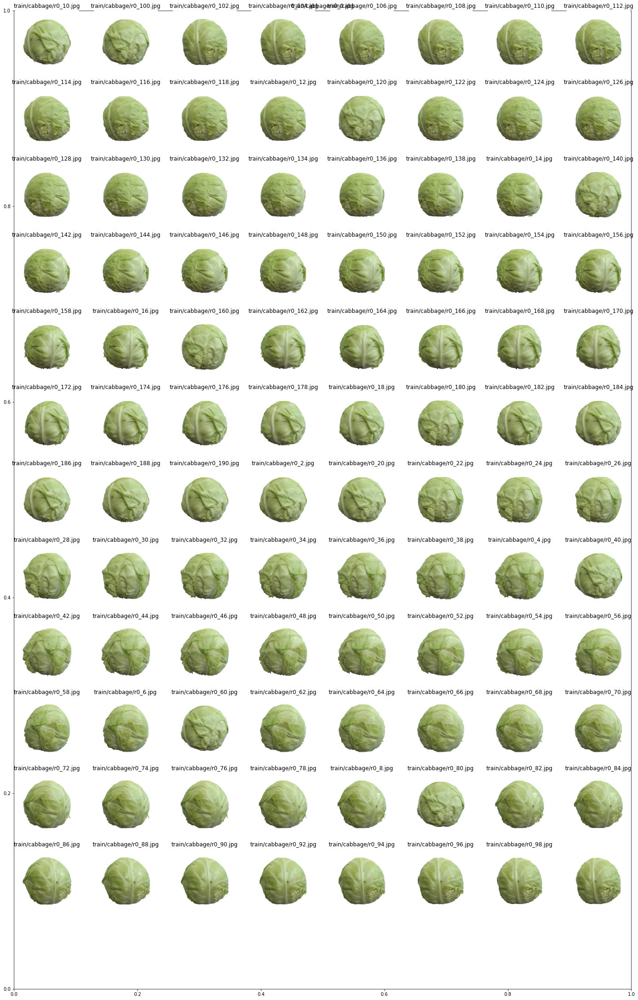

In [130]:
# This method plots all the images of the given file list
def plot_images(list_images, list_labels):
    rows = 8
    columns = int((len(list_images) / rows) + 1)
    fig = plt.figure(figsize=(rows * 3, columns * 3))

    for i in range(len(list_images)):
        plt.title(list_labels[i])
        fig.add_subplot(columns, rows, (i + 1))
        plt.imshow(mpimg.imread(list_images[i]))

        plt.axis("off")

    plt.show()
    
plot_images(images_apple_test, [images_path.partition("/")[2] for images_path in images_apple_test])
plot_images(images_apple_train, [images_path.partition("/")[2] for images_path in images_apple_train])
plot_images(images_cabbage_test, [images_path.partition("/")[2] for images_path in images_cabbage_test])
plot_images(images_cabbage_train, [images_path.partition("/")[2] for images_path in images_cabbage_train])



Conclusion of image scraping:
Looking through the images, there does not seem to be any corrupted image. So, so image cleaning is needed.

<h4>Create a dataset</h4>

In [131]:
from keras.preprocessing import image

# Creates an array of images from the list of paths given
def create_img_array(image_paths, target_size):
    images = np.array([])
    for image_path in image_paths:
        img = image.load_img(image_path, target_size=target_size)
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = img.astype("float32")
        if len(images) == 0:
            images = img
        else:
            images = np.insert(images, images.shape[0], img, axis=0)

    return images


# Create data

# Create a list of all the images with the file paths
X_image_train_paths = images_apple_train.copy()
X_image_train_paths.extend(images_cabbage_train)
X_image_test_paths = images_apple_test.copy()
X_image_test_paths.extend(images_cabbage_test)

# Convert these image paths to np arrays
# In the process, label encode the y like 1 = "Apple" and 0 = "Cabbage"
X_train = create_img_array(X_image_train_paths, (125, 125))

y_train = [1 for _ in images_apple_train]
y_train.extend([0 for _ in images_cabbage_train])
y_train =  np.array(y_train)

X_test = create_img_array(X_image_test_paths, (125, 125))

y_test = [1 for _ in images_apple_test]
y_test.extend([0 for _ in images_cabbage_test])
y_test =  np.array(y_test)


# Normalize Data
X_train = X_train / 255.0
X_test = X_test / 255.0

# View data
print("X_train.shape: ", X_train.shape)
print("y_train.shape: ", len(y_train))
print("X_test.shape: ", X_test.shape)
print("y_test.shape: ", len(y_test))


X_train.shape:  (405, 125, 125, 3)
y_train.shape:  405
X_test.shape:  (201, 125, 125, 3)
y_test.shape:  201


<h4>find the best parameters for building the model</h4>

In [132]:
# This function returns a Keras model. Use the hp argument to define the hyperparameters during model creation.
# Reference 1: https://keras.io/keras_tuner/
# Reference 2: https://www.analyticsvidhya.com/blog/2021/06/tuning-hyperparameters-of-an-artificial-neural-network-leveraging-keras-tuner/
# reference 3: https://www.analyticsvidhya.com/blog/2021/06/create-convolutional-neural-network-model-and-optimize-using-keras-tuner-deep-learning/

def build_model(hp):
    # create model object
    model = keras.Sequential(
        [
            # adding first convolutional layer
            keras.layers.Conv2D(
                # adding filter
                filters=hp.Int("conv_1_filter", min_value=32, max_value=128, step=16),
                # adding filter size or kernel size
                kernel_size=hp.Choice("conv_1_kernel", values=[3, 5]),
                # activation function
                activation="relu",
                input_shape=(125, 125, 3),
            ),
            # adding second convolutional layer
            keras.layers.Conv2D(
                # adding filter
                filters=hp.Int("conv_2_filter", min_value=32, max_value=64, step=16),
                # adding filter size or kernel size
                kernel_size=hp.Choice("conv_2_kernel", values=[3, 5]),
                # activation function
                activation="relu",
            ),
            # adding flatten layer
            keras.layers.Flatten(),
            # adding dense layer
            keras.layers.Dense(
                units=hp.Int("dense_1_units", min_value=32, max_value=128, step=16),
                activation="relu",
            ),
            # output layer
            keras.layers.Dense(2, activation="sigmoid"),
        ]
    )
    # compilation of model
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice("learning_rate", values=[1e-2, 1e-3])
        ),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )
    return model


# RandomSearch searchess for the best fit for the least loss function
# The max trials is set to limit the function form over using compute
tuner = kt.RandomSearch(
    build_model,
    objective="val_accuracy",
    max_trials=3,
    project_name="image_classification_using_keras_tensorflow_framework",
)

X_train, X_val, y_train, y_val = sklearn.model_selection.train_test_split(
    X_train, y_train, test_size=0.2, random_state=1
)

# tuner.search tries all the possible combinations and permutations to give a the best model with the least error
tuner.search(X_train, y_train, epochs=10, validation_data=(X_val, y_val))
tuner.search_space_summary()


Trial 3 Complete [00h 02m 43s]
val_accuracy: 0.7530864477157593

Best val_accuracy So Far: 1.0
Total elapsed time: 00h 11m 03s
INFO:tensorflow:Oracle triggered exit
Search space summary
Default search space size: 6
conv_1_filter (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 16, 'sampling': None}
conv_1_kernel (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
conv_2_filter (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 64, 'step': 16, 'sampling': None}
conv_2_kernel (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
dense_1_units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 16, 'sampling': None}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001], 'ordered': True}


In [133]:
# Get the best model
best_model = tuner.get_best_models()[0]
best_model.build(X_train.shape)
best_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 123, 123, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 121, 121, 48)      27696     
                                                                 
 flatten (Flatten)           (None, 702768)            0         
                                                                 
 dense (Dense)               (None, 128)               89954432  
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 89,984,178
Trainable params: 89,984,178
Non-trainable params: 0
_________________________________________________________________


<h4>Evaluate the model</h4>

In [134]:
best_model.evaluate(X_test, y_test)

7/7 [==============================] - 1s 150ms/step - loss: 0.0453 - accuracy: 1.0000


[0.04527660459280014, 1.0]

<h4>Save the Model</h4>

In [135]:
# save model
# cnn.save('final_model.h5')
best_model.save('final_model.h5')
# models.load_model('final_model.h5')

<h4>Predict images</h4>

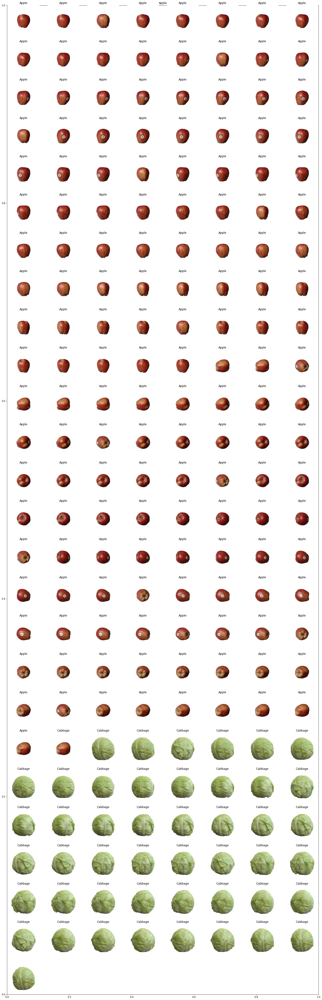

In [136]:
# Predicts images and plots a graphs with the predicted outputs
def predict_images(list_images):
    rows = 8
    columns = int((len(list_images) / rows) + 1)
    fig = plt.figure(figsize=(rows * 3, columns * 3))

    for i in range(len(list_images)):
        # Load the image
        img = image.load_img(list_images[i], target_size=(125, 125))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = img.astype("float32")
        img = img / 255.0

        # Predict the o/p of the image
        pred = best_model.predict(img)
        if np.argmax(pred[0]) == 1:
            pred = "Apple"
        else:
            pred = "Cabbage"

        # Add the prediction as a title
        plt.title(str(pred))

        # Plot the image
        fig.add_subplot(columns, rows, (i + 1))
        plt.imshow(mpimg.imread(list_images[i]))
        plt.axis("off")

    plt.show()


predict_images(X_image_test_paths)
